In [29]:
%matplotlib notebook
#%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.io import loadmat
from matplotlib.colors import LogNorm
import pandas as pd
from bocpd import StudentT
from bocpd import bocpd
from f1score import f1_score

from mpl_toolkits.mplot3d import Axes3D 

Kolomogrov flow

In [17]:
# visualization
Kol=loadmat('Kol_Label.mat')
w=Kol['w'] #This data is separated every 5 time units
[M,N1,N2]=w.shape
w=w.reshape(M,-1)

state=Kol['state'].squeeze()

In [2]:
datapts = np.load("/Users/senlin/Downloads/Kolmogorov_Flow/allVAElatent.npy") 
training_data = np.diff(datapts[:5000,]).T
sc = StandardScaler()
data = sc.fit_transform(training_data)

<IPython.core.display.Javascript object>


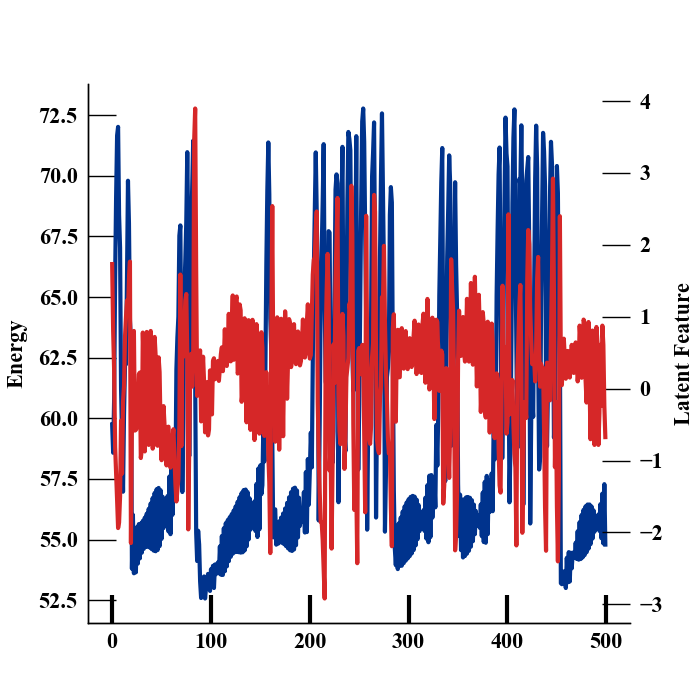

<IPython.core.display.Javascript object>


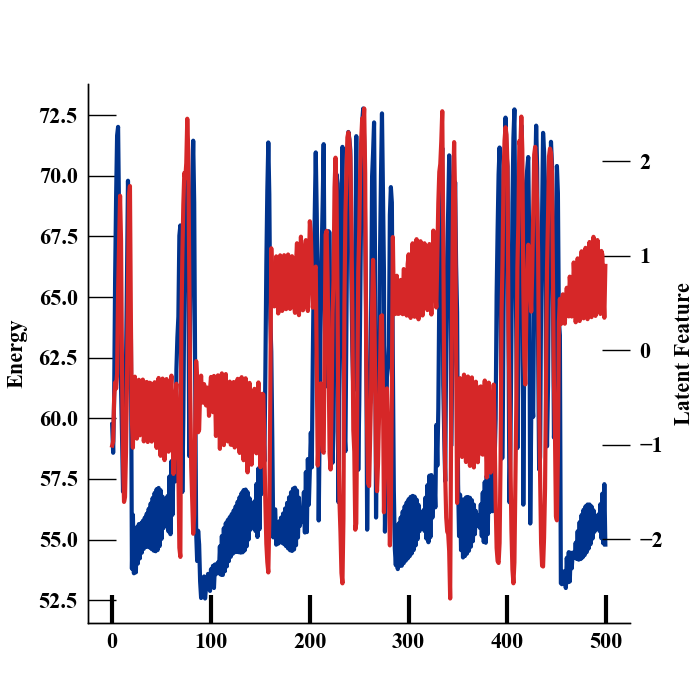

<IPython.core.display.Javascript object>


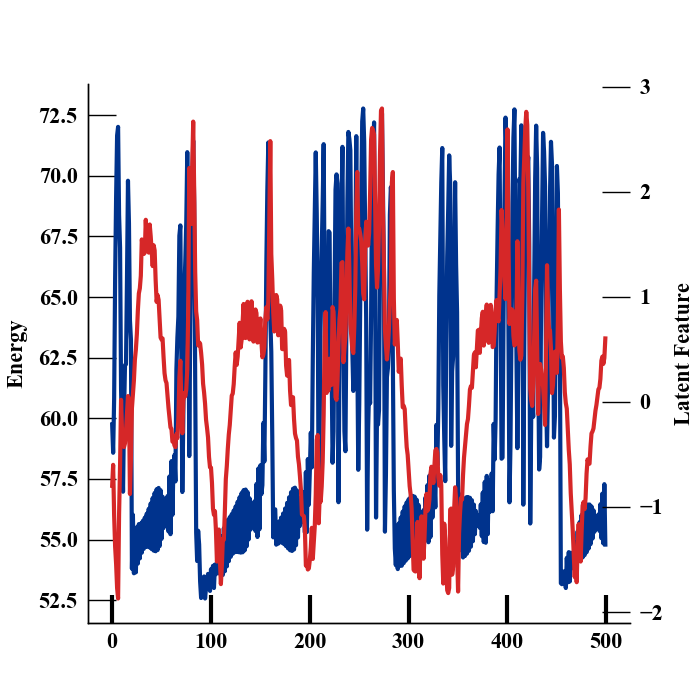

<IPython.core.display.Javascript object>


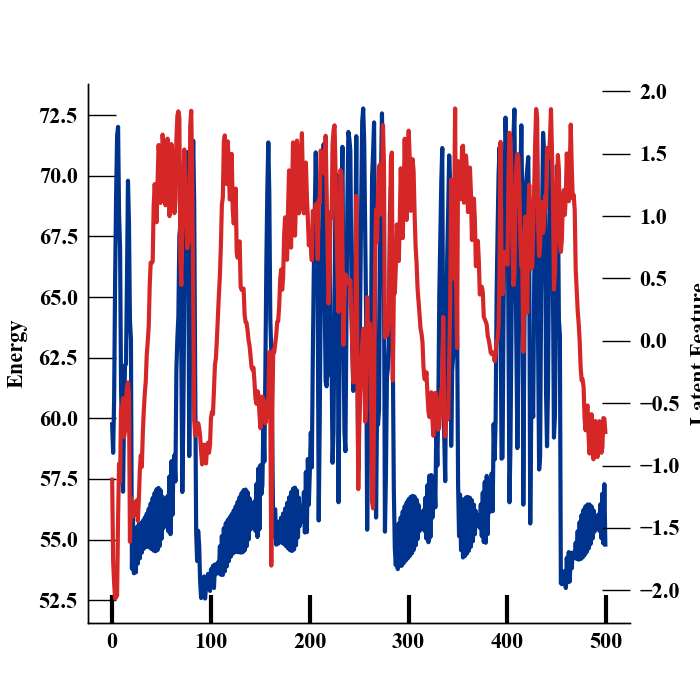

In [30]:
testseq = list(range(4200,4700))
plt.rcParams.update({'font.size': 6})
plt.rcParams.update({'font.family': 'Times New Roman'})
# Define nature-like colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#a55194', '#e95c47']

# Create a plot for each latent feature
for k in range(4):
    fig, ax = plt.subplots(figsize=(3.5, 3.5))
    ax2 = ax.twinx()

    # Plot energy on primary y-axis
    ax.plot(np.linalg.norm(w[testseq], axis=1), color='#00338D',label='energy')
    ax.set_ylabel('Energy', fontsize=8)
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)
    ax.yaxis.set_tick_params(width=0.5)
    ax.grid(False)

    # Plot latent feature on secondary y-axis
    ax2.plot(datapts[k, testseq], color='#d62728',label='latent')
    ax2.set_ylabel('Latent Feature', fontsize=8)
    ax2.set_xlabel('Time', fontsize=8)
    ax2.tick_params(axis='both', which='major', labelsize=8)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_linewidth(0.5)
    ax2.spines['left'].set_linewidth(0.5)
    ax2.xaxis.set_tick_params(width=0.5)
    ax2.yaxis.set_tick_params(width=0.5)
    

    # Save figure
    plt.savefig(f'latent_feature{k+1}.png', dpi=600, bbox_inches='tight')

We use a grid search for the hyperparameter optimzation
$\alpha$ and $\beta$ selected from $(0.01, 0.1, 1, 10)$, $\lambda$ select from $(5,10,50)$

In [39]:
#### lambda, kappa, beta, alpha are hyperparameters
#### we use grid search for the purpose of hyperparameter optimization
sequence = list(range(4200,4700))
Tstate = state[sequence]
Annotation = np.concatenate(([0],np.where(np.diff(Tstate)!=0)[0]+1))
akb = [0.01, 0.1, 1, 10]
lamb = [5,10,50]
result = []
for alpha in akb:
    for beta in akb:
        for lam in lamb:
            model = {0:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    1:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    2:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    3:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta)}
            R,cps = bocpd(data[sequence,],model,lam)
            #cps[1:]-=3
            F,P,R = f1_score(Annotation,cps,margin = 5, return_PR=True)
            result.append([alpha,beta,lam,F,P,R])


In [40]:
result_table = pd.DataFrame(result,columns =['alpha','beta','lambda','F1','Precsion','Recall'])
result_table.loc[result_table['F1']>0.9]

,alpha,beta,lambda,F1,Precsion,Recall
0,0.01,0.01,5,0.960000,0.923077,1.000000
1,0.01,0.01,10,0.960000,0.923077,1.000000
2,0.01,0.01,50,0.909091,1.000000,0.833333
3,0.01,0.10,5,1.000000,1.000000,1.000000
4,0.01,0.10,10,1.000000,1.000000,1.000000
5,0.01,0.10,50,0.909091,1.000000,0.833333
18,0.10,1.00,5,0.923077,0.857143,1.000000
19,0.10,1.00,10,0.960000,0.923077,1.000000
20,0.10,1.00,50,1.000000,1.000000,1.000000
47,10.00,10.00,50,0.923077,0.857143,1.000000


In [45]:
## test model on test set
alpha,beta,lam = 0.1,1,50
testseq = list(range(4200,4700))
Tstate = teststate[testseq]
Annotation = np.concatenate(([0],np.where(np.diff(Tstate)!=0)[0]+1))
model = {0:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
        1:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
        2:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
        3:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta)}

R,cps = bocpd(data[testseq,],model,lam)

<IPython.core.display.Javascript object>


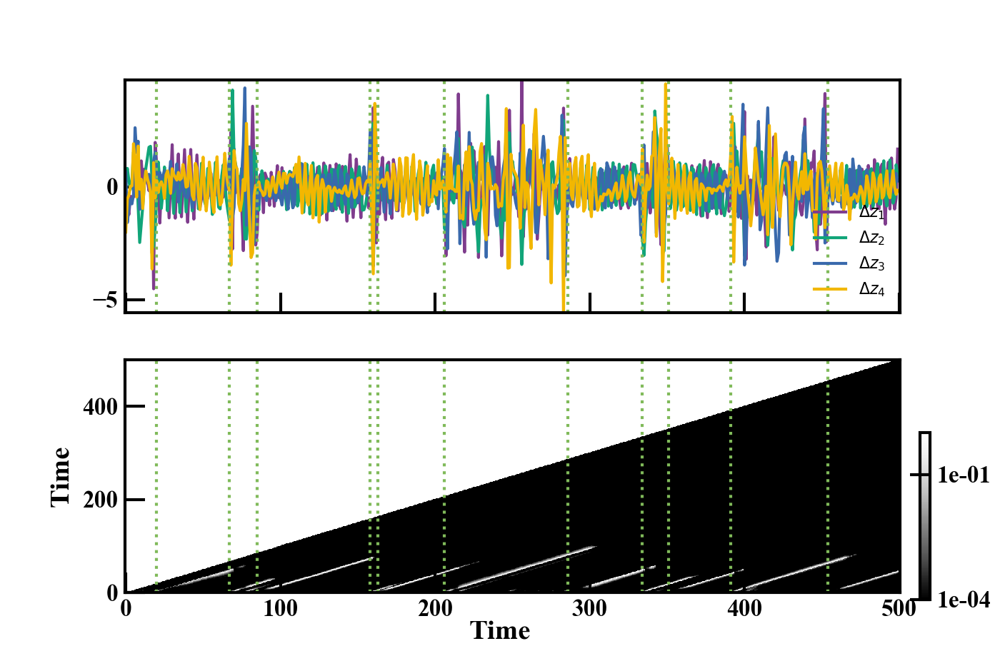

In [46]:
import matplotlib.colors as mcolors
import numpy as np
from matplotlib.ticker import LogFormatter
from matplotlib import ticker


# Adjust font size and style
plt.rcParams.update({'font.size': 12, 'font.family': 'Times New Roman'})

# Define nature-like colors
colors = ['#7F3C8D', '#11A579', '#3969AC', '#F2B701', '#E73F74', '#80BA5A', '#E68310', '#008695', '#CF1C90', '#f97b72', '#4b4b8f']

# Create figure and axes
fig, axes = plt.subplots(2, 1, figsize=(3.5*2,3.5*4/3), sharex=True)
ax1, ax2 = axes

# Plot input data
ax1.plot(data[testseq,0], label=r'$\Delta z_1$', color=colors[0])
ax1.plot(data[testseq,1], label=r'$\Delta z_2$', color=colors[1])
ax1.plot(data[testseq,2], label=r'$\Delta z_3$', color=colors[2])
ax1.plot(data[testseq,3], label=r'$\Delta z_4$', color=colors[3])
ax1.legend(loc='lower right', frameon=False,fontsize=8)
ax1.margins(0)

# Plot reconstructed data
im = ax2.imshow(R, origin='lower',aspect='auto', cmap='Greys_r', norm=mcolors.LogNorm(vmin=0.0001, vmax=1))
ax2.set_ylabel('Time',fontsize=14)
ax2.margins(0)

cbaxes = fig.add_axes([0.92, 0.1, 0.01, 0.25])
formatter = LogFormatter(10, labelOnlyBase=False)
cbar = plt.colorbar(im, cax=cbaxes, format=formatter)
cbar.ax.tick_params()

# Add vertical lines at change points
for cp in cps[1:]:
    ax1.axvline(cp, c=colors[5], ls='dotted')
    ax2.axvline(cp, c=colors[5], ls='dotted')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.2)

# Set x-axis label for the whole figure
fig.text(0.5, 0.04, 'Time', ha='center',fontsize=14)

# Save figure
plt.savefig('cpd3.png', dpi=300, bbox_inches='tight')

<IPython.core.display.Javascript object>


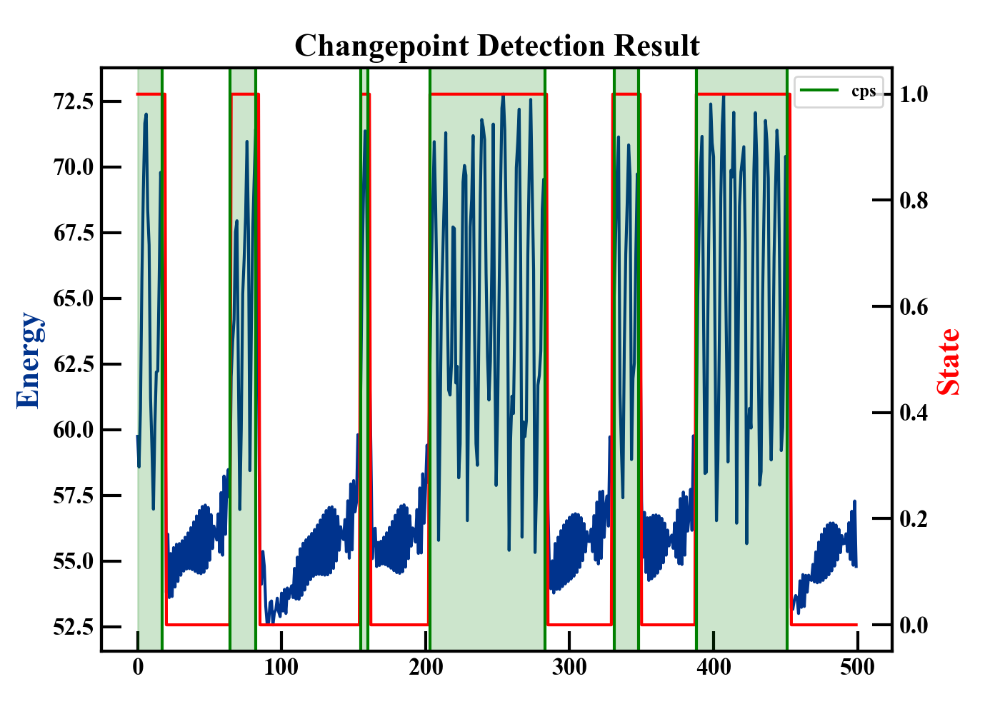

In [47]:
fig, ax = plt.subplots(figsize=(7, 5))

ax.plot(np.linalg.norm(w[4200:4700, :], axis=1), linewidth=1.5, color='#00338D')
ax.set_ylabel('Energy', fontsize=16, color='#00338D')

ax2 = ax.twinx()
ax2.plot(teststate[4200:4700], 'r-', linewidth=1.5)
ax2.set_ylabel('State', fontsize=16, color='red')

cp4plot = np.concatenate(([0],cps[1:]-3,[500]))
for idx,change in enumerate(cp4plot):
    if change != 0 and change!=500:
        verticle = ax2.axvline(x=change, color='g',linewidth=1.5)
    if idx%2==0 and idx+1<len(cp4plot):       
        area = ax2.axvspan(cp4plot[idx], cp4plot[idx+1], alpha=0.2, color='g')

plt.title(label='Changepoint Detection Result', fontsize=16, fontweight='bold', fontname='Times New Roman')
ax2.legend([verticle],['cps'],loc='upper right', fontsize=9)
# Styling
plt.style.use('default')
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 16
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.tight_layout()

plt.savefig('cpd_result.png', dpi=300, bbox_inches='tight')

Lorenz

We have 50 Lorenz trajectories generated by different $R_1$ and $R_2$

In [61]:
lorenz = np.load("Trajectory_1.npy") 
sc = StandardScaler()
data = sc.fit_transform(lorenz)

In [62]:
data.shape

(500, 3)

<IPython.core.display.Javascript object>


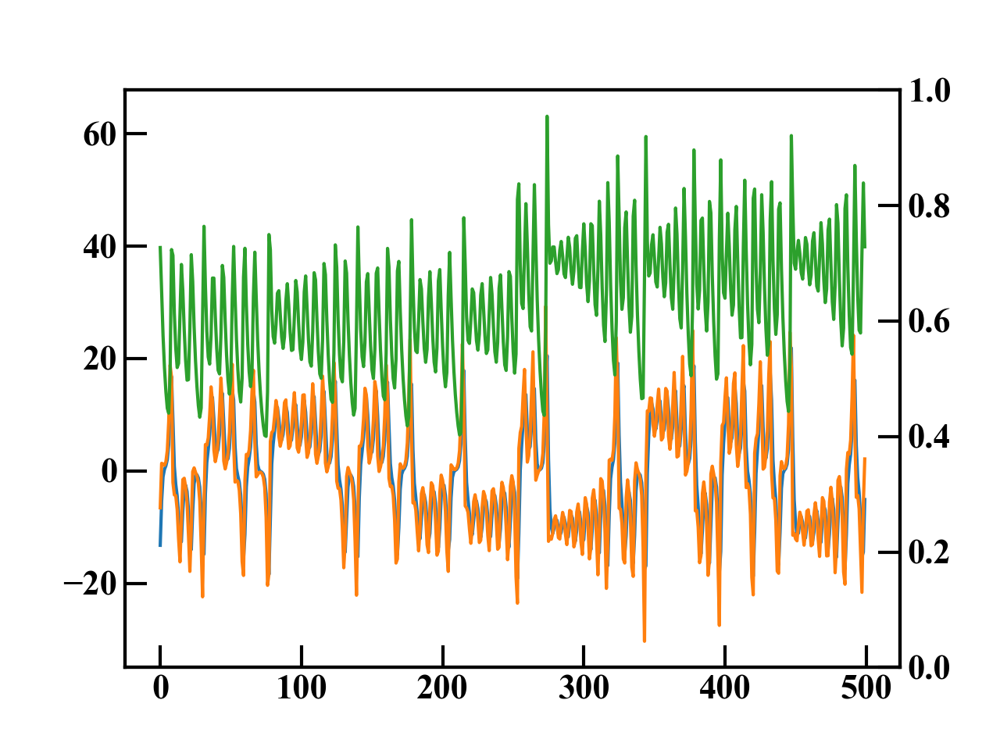

In [63]:
fig, ax = plt.subplots()
ax2 = ax.twinx()

ax.plot(lorenz[:])

We manually find all changepoints and named as "Annotation" in the first trajectories

In [65]:
sequence = list(range(len(data)))
Annotation = np.array([0, 7, 128, 148, 184, 198,223,255,291,302,315,331,340,358,386,389,405,421,448,452,475,490])
#Annotation = np.array([0, 3, 17, 40,63,75,89,113,125,137,147,155, 176, 205,220,235,258,276,293,307,320,332,339,351,363,371,376,383,387,394,396,419,432,439,467,475,494])
akb = [0.1, 1, 10,100]
lamb = [5,10,50]
result = []
for lam in lamb:
    for alpha in akb:
        for beta in akb:
            model = {0:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    1:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    2:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
                    3:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta)}
            R,cps = bocpd(data[sequence,],model,lam)
            #cps[1:]-=3
            #cover = covering(cps,Annotation-1,500)
            F,P,R = f1_score(Annotation,cps,margin = 5, return_PR=True)
            result.append([alpha,beta,lam,F,P,R])


/Users/senlin/Downloads/Kolmogorov_Flow/bocpd.py:160: RuntimeWarning: divide by zero encountered in log
  currprobs = most_likely_sets + np.log(R[0:t+2, t + 1])[::-1]


We found $\alpha = 10$, $\beta=10$, $\lambda = 10$ gives the best detection performance. Will use this set of hyperparameter to detect changepoints on other trajectories.

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


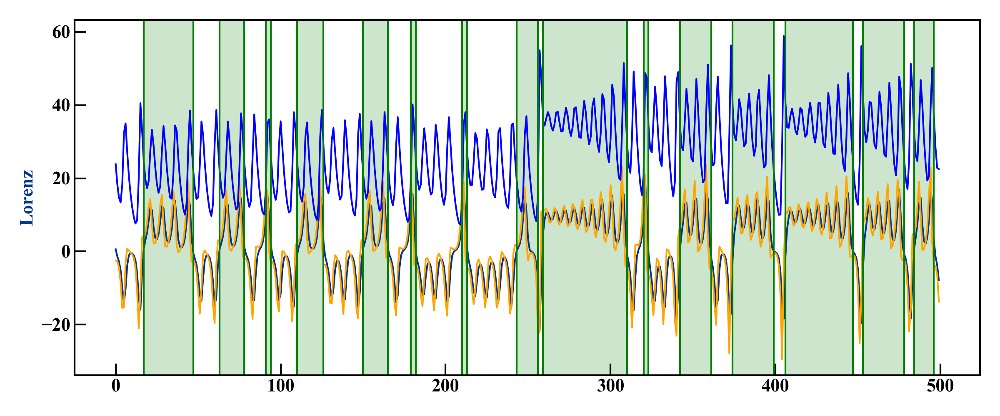

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


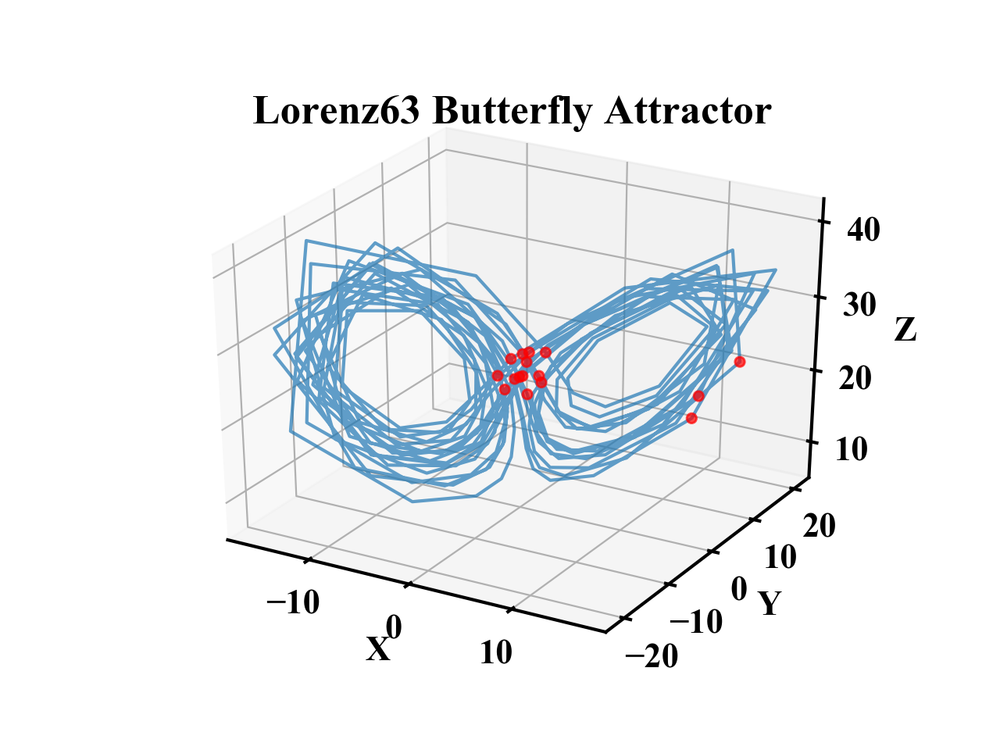

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


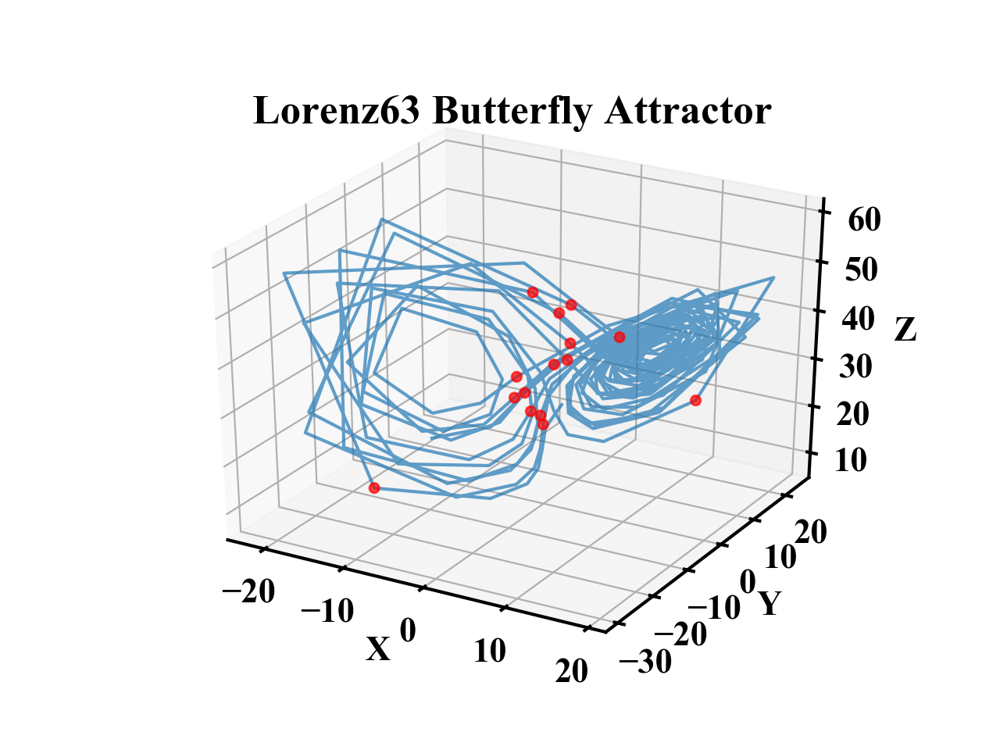

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


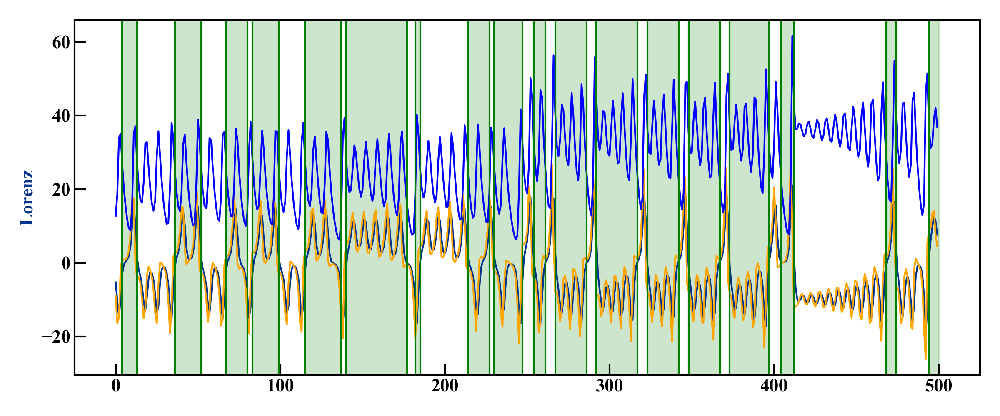

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


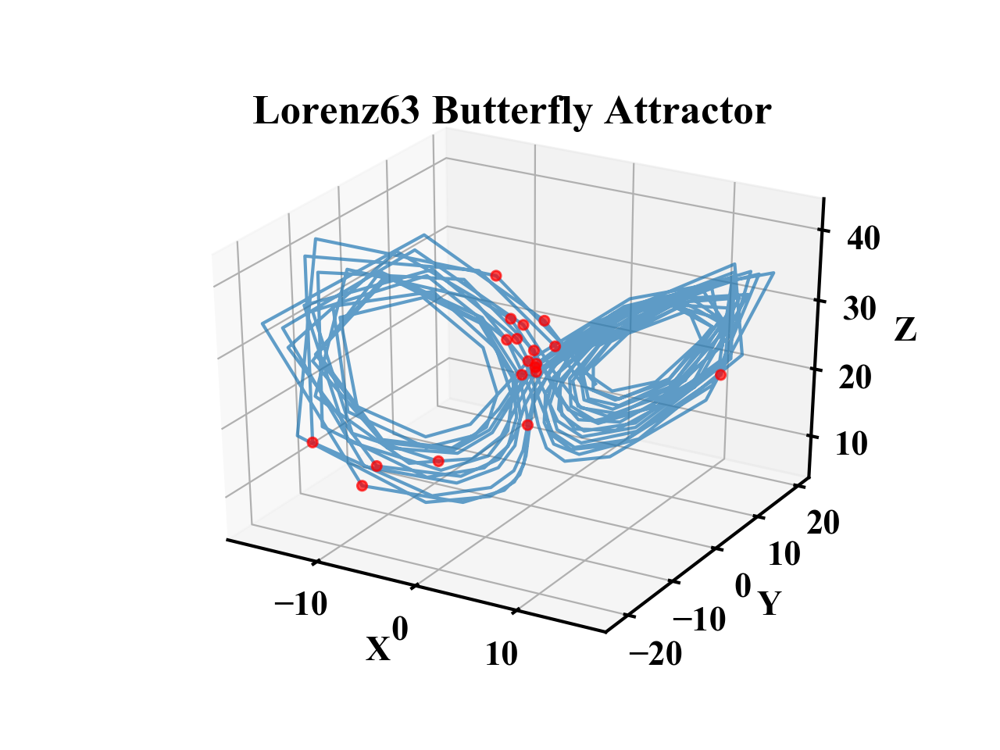

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


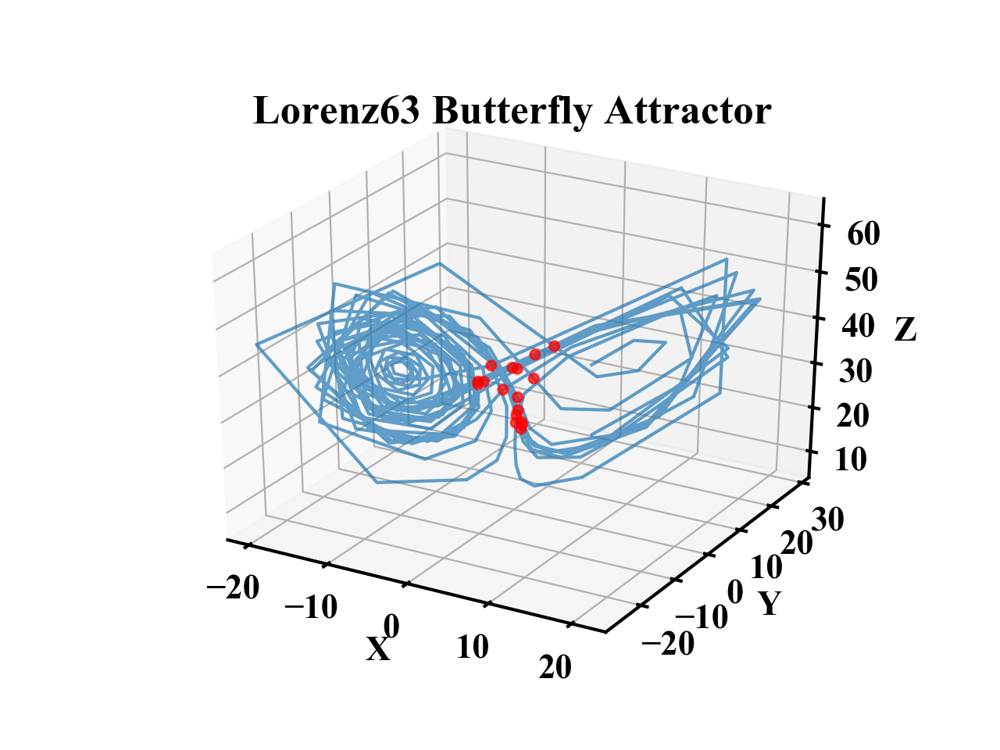

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


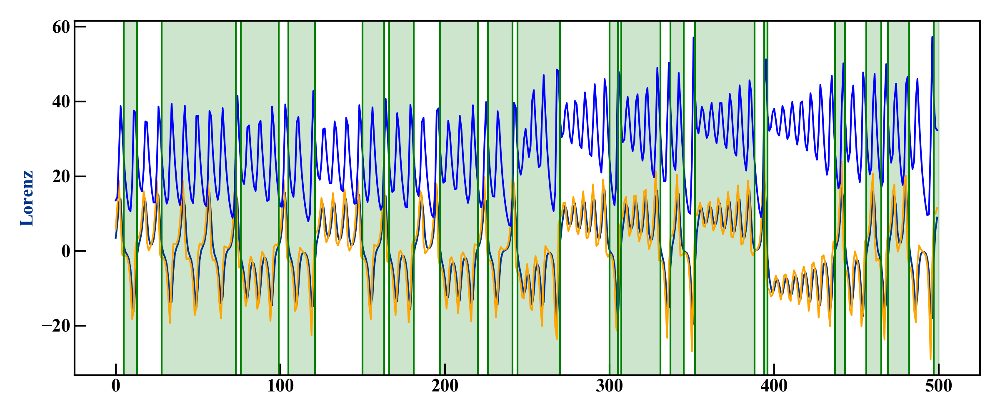

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


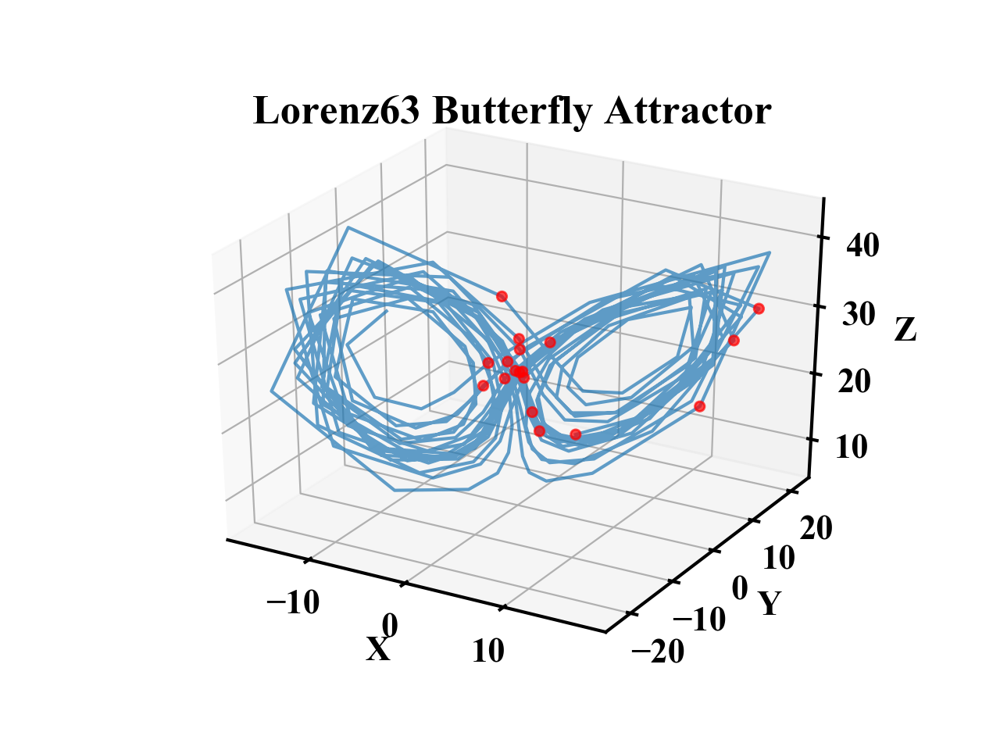

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


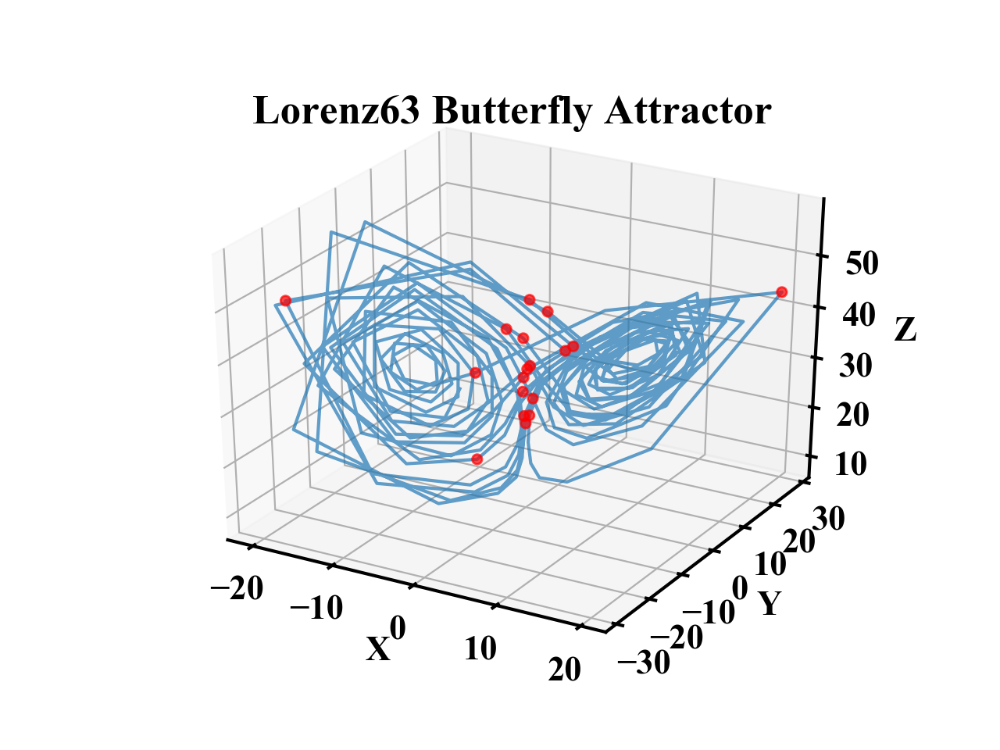

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


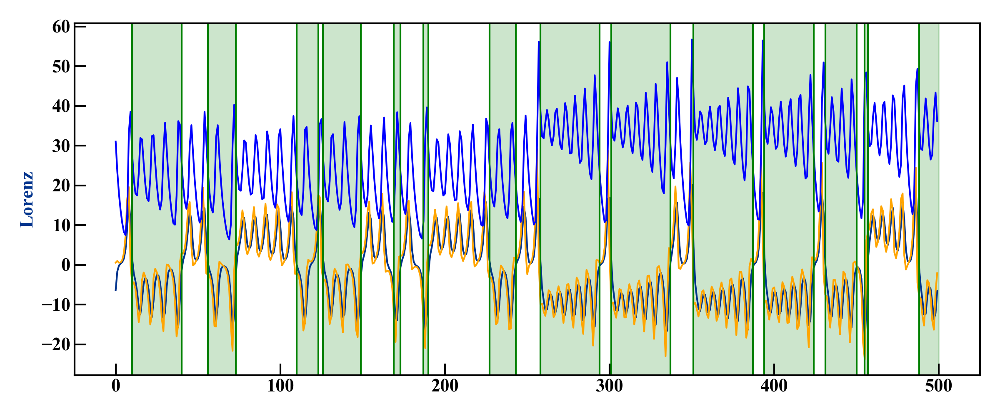

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


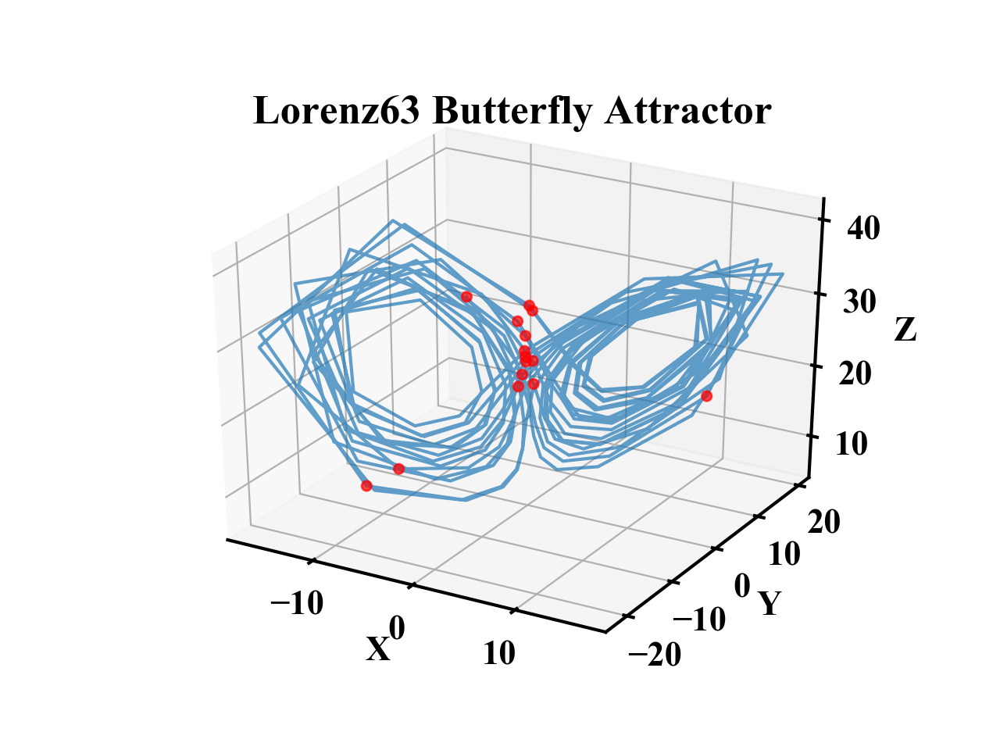

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


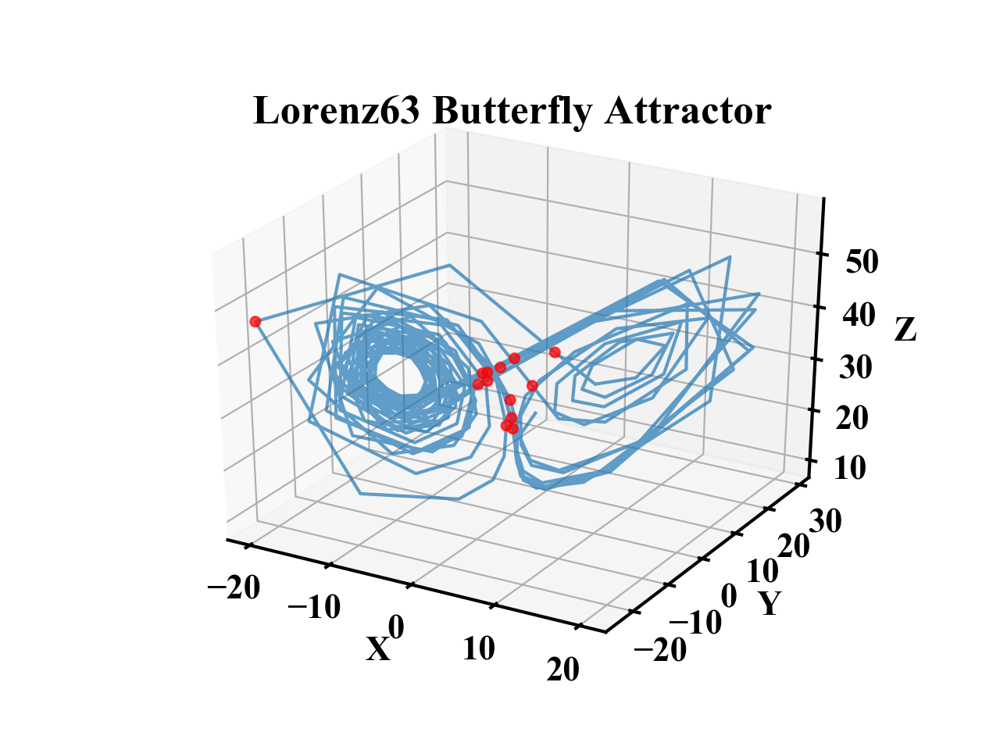

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


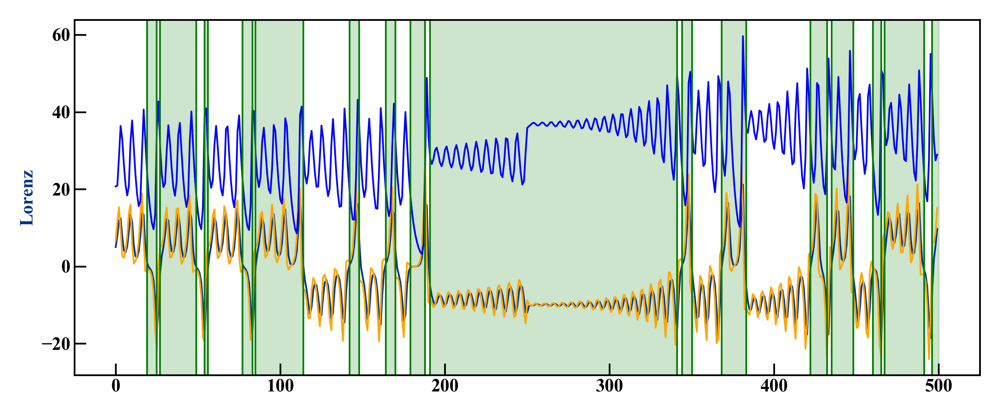

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


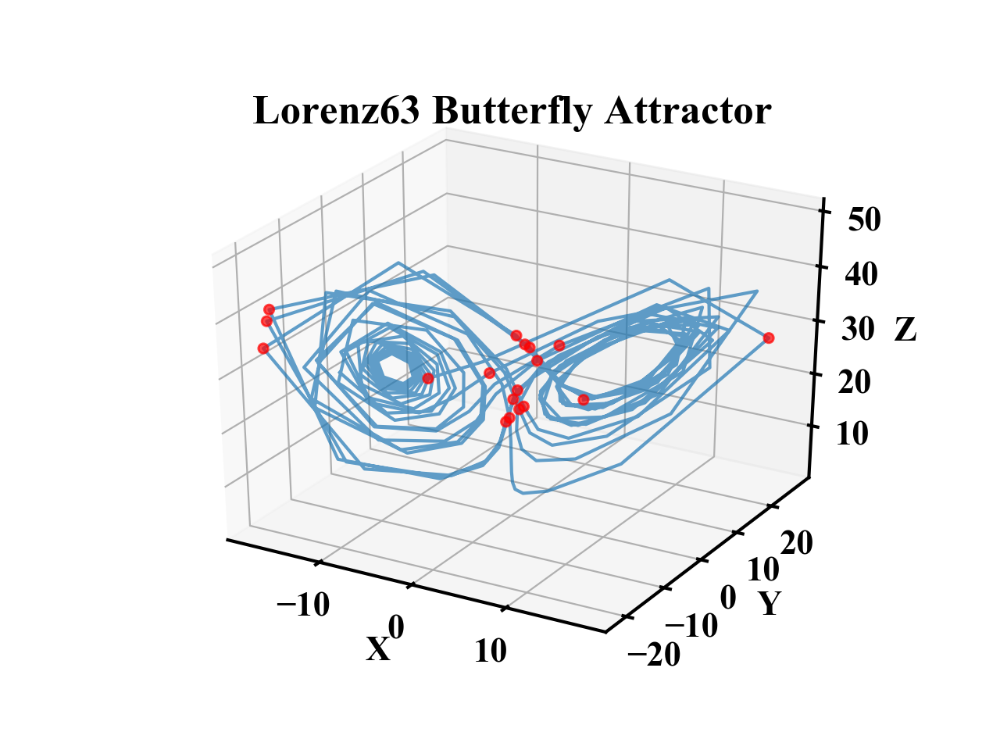

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


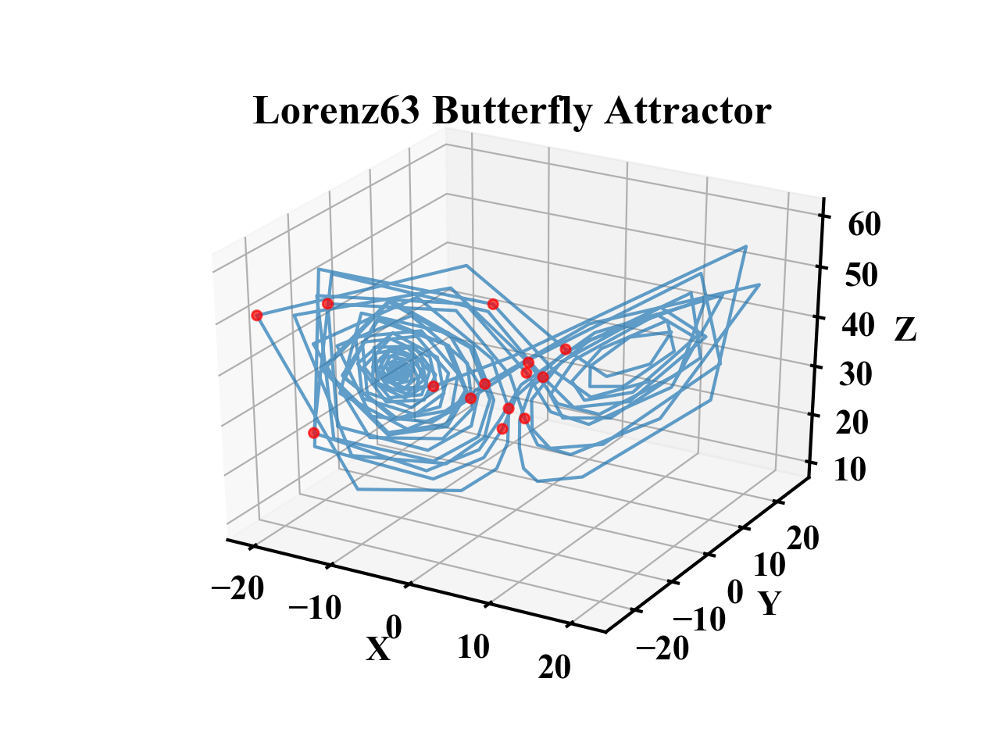

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


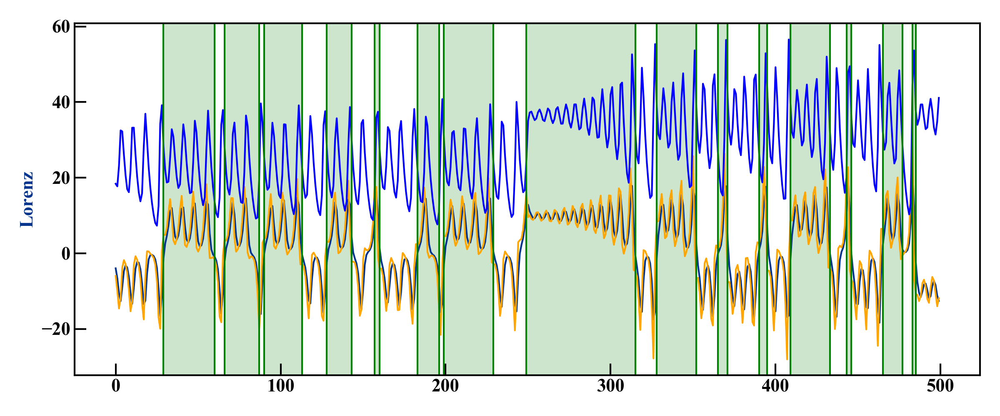

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


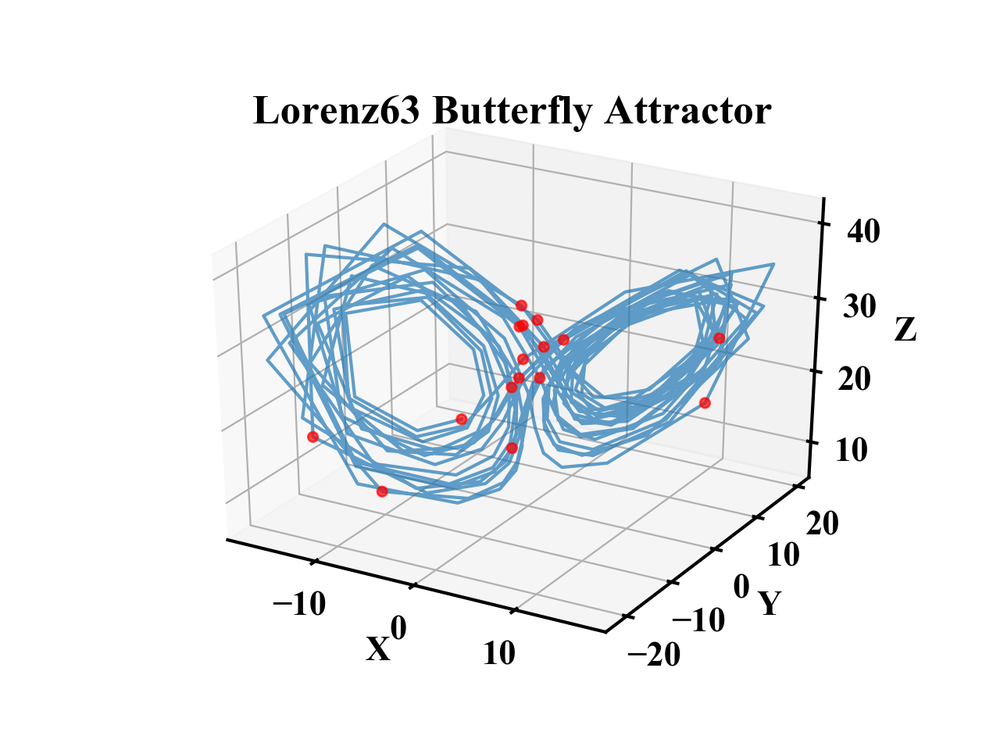

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


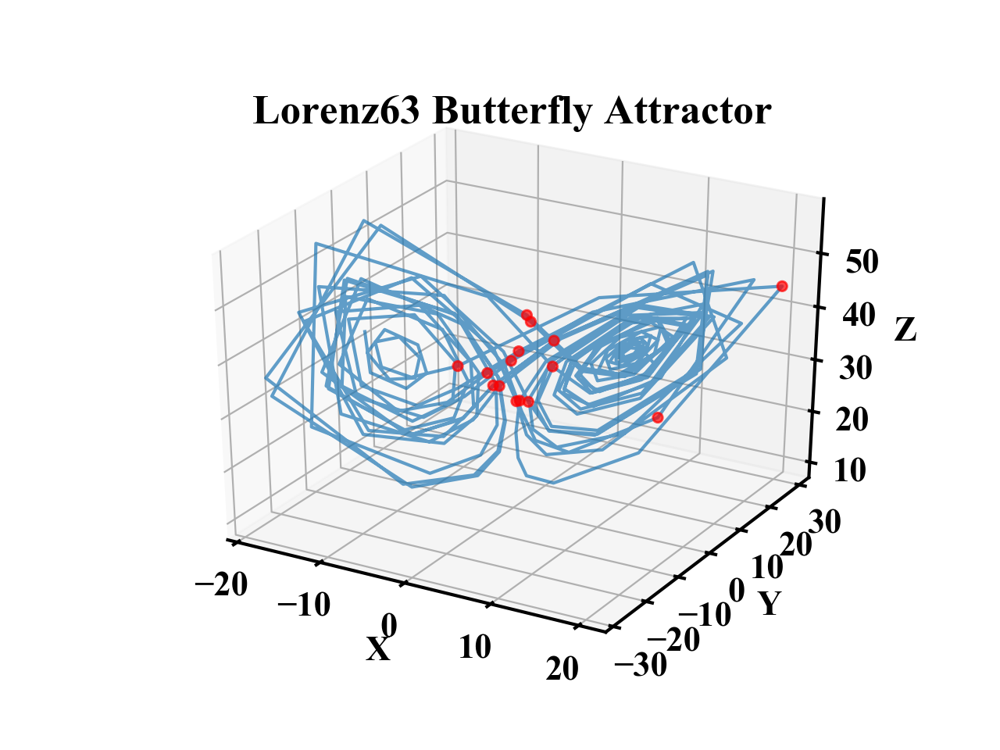

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


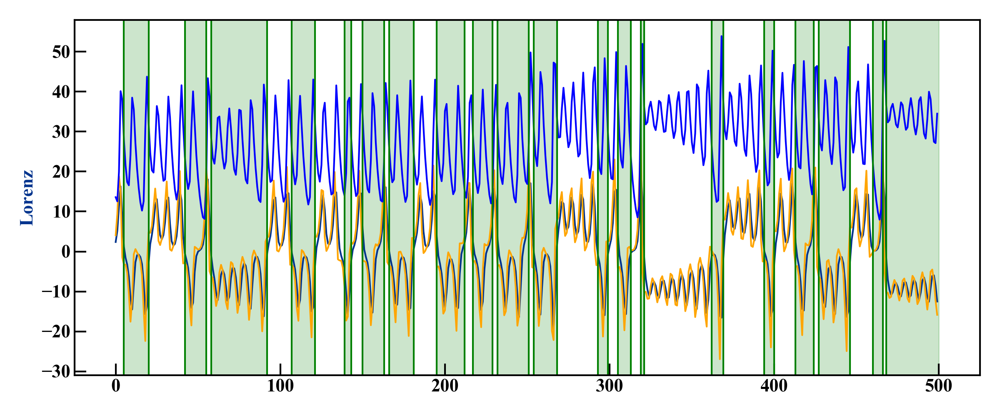

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


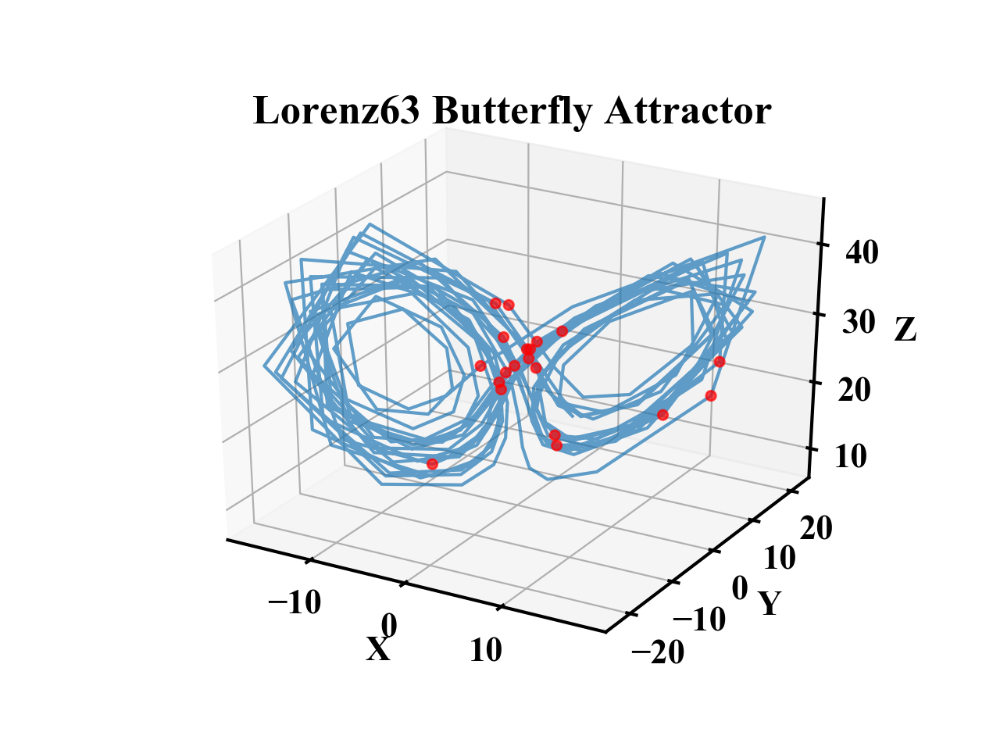

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


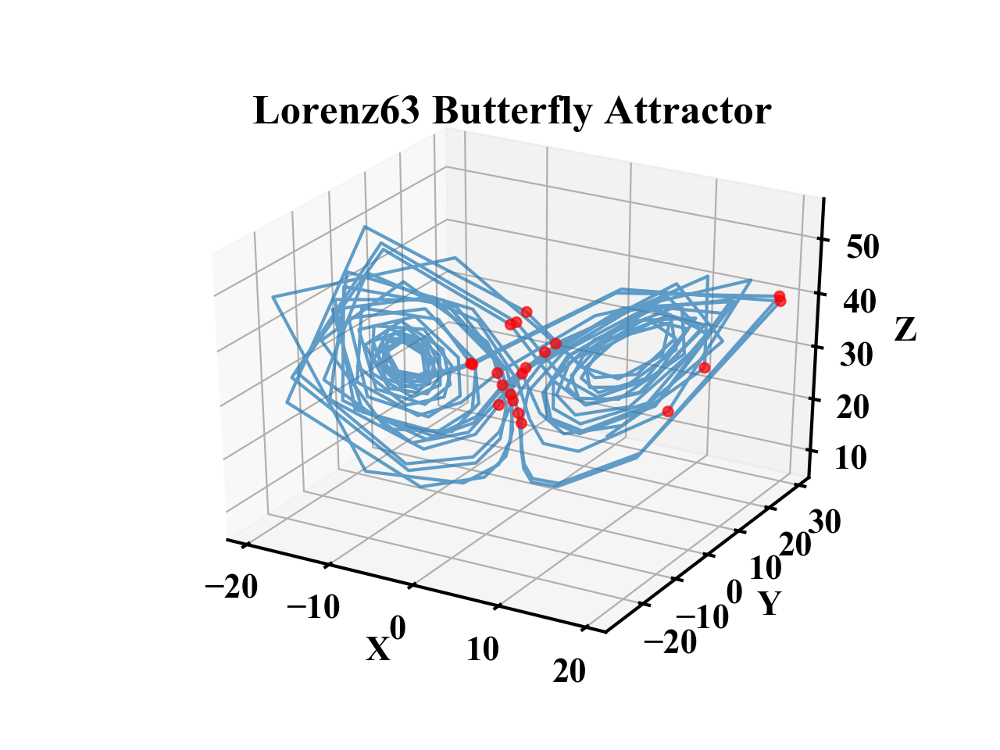

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


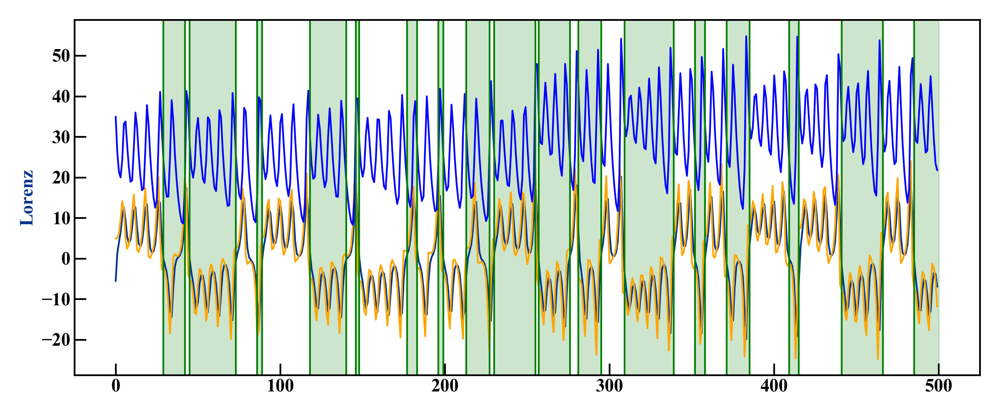

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


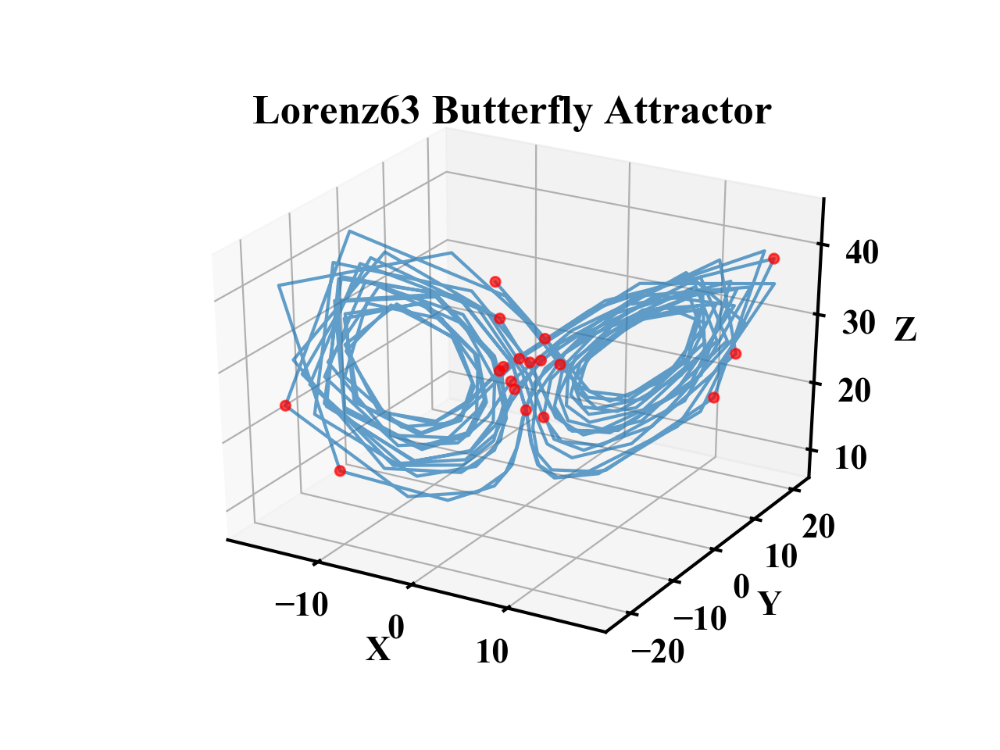

/Users/senlin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


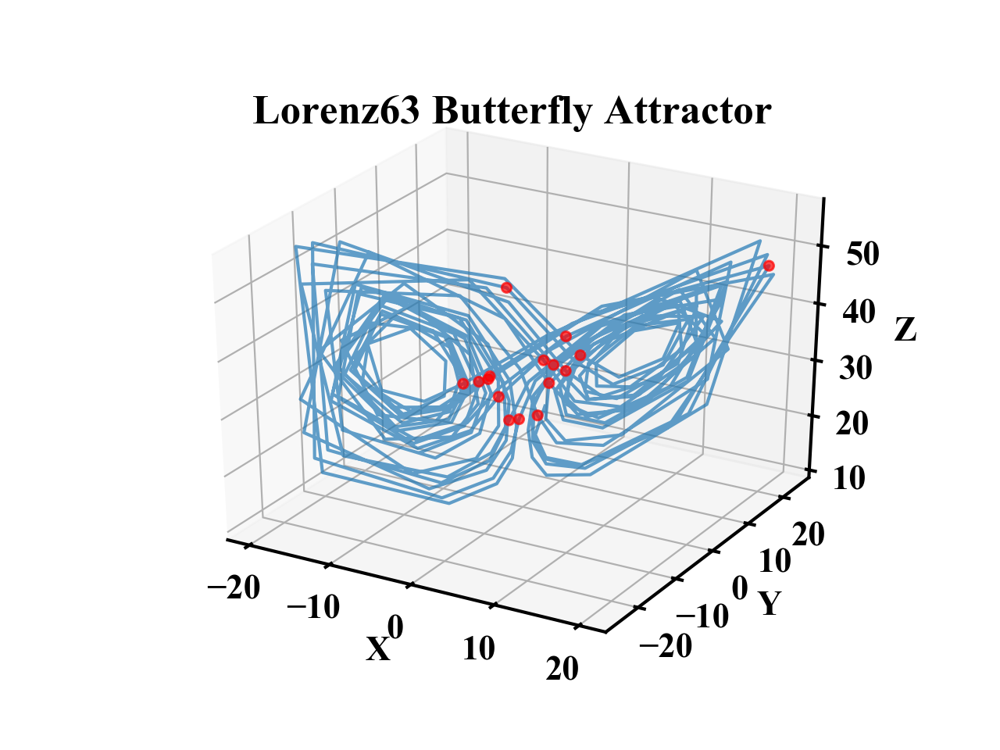

In [124]:
for i in np.where(num_cps[:,1]<=num_cps[:,0])[0]:
    lorenz = np.load("Trajectory_"+str(i)+".npy") 
    training_data = lorenz[0:5000,:]
    sc = StandardScaler()
    data = sc.fit_transform(training_data)

    alpha,beta,lam = 10,10,10
    sequence = list(range(500))
    model = {0:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            1:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            2:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            3:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta)}


    R,cps = bocpd(data[sequence,0:3],model,lam)
    
    fig, ax = plt.subplots(figsize=(12, 5))

    ax.plot(training_data[sequence, 0], linewidth=1.5, color='#00338D', label='x')
    ax.plot(training_data[sequence,  1], linewidth=1.5, color='#FFA500', label='y')
    ax.plot(training_data[sequence,  2], linewidth=1.5, color='b', label='z')
    ax.set_ylabel('Lorenz', fontsize=16, color='#00338D')


    cp4plot = np.concatenate(([0],cps[1:],[len(sequence)]))
    for idx,change in enumerate(cp4plot):
        if change != 0 and change!=500:
            verticle = ax.axvline(x=change, color='g',linewidth=1.5)
        if idx%2==1 and idx+1<len(cp4plot):       
            area = ax.axvspan(cp4plot[idx], cp4plot[idx+1], alpha=0.2, color='g')

    #plt.title(label='Changepoint Detection Result', fontsize=16, fontweight='bold', fontname='Times New Roman')
    ax2.legend([verticle],['cps'],loc='upper right', fontsize=9)
    # Styling
    plt.style.use('default')
    plt.rcParams['axes.linewidth'] = 1.5
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'Times New Roman'
    plt.rcParams['font.size'] = 16
    plt.rcParams['xtick.major.size'] = 10
    plt.rcParams['ytick.major.size'] = 10
    plt.rcParams['xtick.major.width'] = 1.5
    plt.rcParams['ytick.major.width'] = 1.5
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.tight_layout()

    #plt.savefig("lorenz_cpd_result"+str(i)+".png", dpi=300, bbox_inches='tight')
    
    cps_loc = training_data[(cps[cps<250]).astype(int),:]
    

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(training_data[:250,0], training_data[:250,1],  training_data[:250,2], alpha=0.7)
    ax.scatter(cps_loc[:,0], cps_loc[:,1],  cps_loc[:,2], alpha=0.7,color='red')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Lorenz63 Butterfly Attractor')
    plt.show()
   # plt.savefig("cpd_lorenz_butterfly_0:250"+str(i)+".png", dpi=300, bbox_inches='tight')


    cps_loc = training_data[(cps[cps>250]).astype(int),:]

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(training_data[250:,0], training_data[250:,1],  training_data[250:,2], alpha=0.7)
    ax.scatter(cps_loc[:,0], cps_loc[:,1],  cps_loc[:,2], alpha=0.7,color='red')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Lorenz63 Butterfly Attractor')
    plt.show()
   # plt.savefig("cpd_lorenz_butterfly_250:500"+str(i)+".png", dpi=300, bbox_inches='tight')

In [73]:
# we have 50 simulated lorenz trajectories. For each one, there is a change of model in the 250 timestep.
# The first half trajectory simulated with R1 and the second half simulated with R2 that R1<<R2.
# We observed that statistically there are more changepoints detected in the second half trajectories
# This indicates the use of changepionts detection can be used to detect regime change and model change as well

num_cps = np.zeros((50,2))
for i in range(50):
    lorenz = np.load("Trajectory_"+str(i)+".npy") 
    training_data = lorenz[0:500,:]
    sc = StandardScaler()
    data = sc.fit_transform(training_data)

    alpha,beta,lam = 10,10,10
    sequence = list(range(500))
    model = {0:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            1:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            2:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta),
            3:StudentT(mu=0,kappa=1,alpha=alpha,beta=beta)}


    R,cps = bocpd(data[sequence,0:3],model,lam)
    
    num_cps[i,0] = np.sum(cps<250)
    num_cps[i,1] = np.sum(cps>=250)

<IPython.core.display.Javascript object>


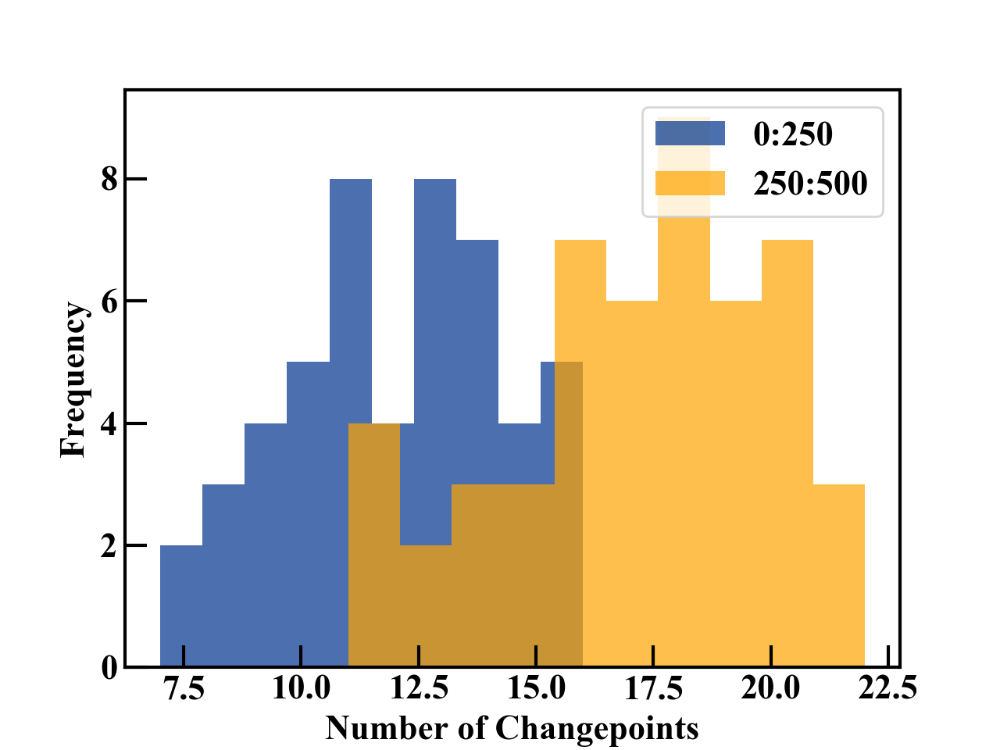

In [74]:
dim1 = num_cps[:, 0]
dim2 = num_cps[:, 1]

# Plot histogram for dimension 1
plt.figure()
plt.hist(dim1, bins=10, color='#00338D', alpha=0.7, label='0:250')

# Plot histogram for dimension 2
plt.hist(dim2, bins=10, color='#FFA500', alpha=0.7, label='250:500')

# Set labels and title
plt.xlabel('Number of Changepoints')
plt.ylabel('Frequency')
#plt.title('Comparison of Changepoints between Dimension 1 and Dimension 2')

# Add legend
plt.legend()

# Show the plot
plt.show()

plt.savefig("num_cps.png", dpi=300, bbox_inches='tight')